# Introduction  

Welcome to the Petals to the Metal competition! In this competition, you’re challenged to build a machine learning model to classify 104 types of flowers based on their images.
In this tutorial notebook, you'll learn how to build an image classifier in Keras and train it on a Tensor Processing Unit (TPU). At the end, you'll have a complete project you can build off of with ideas of your own.

To improve classification accuracy of the model on the test dataset, the following are explored:

* Input image size
* Pretrained model and number of trainable parameters of final model
* Data augmentation
* Regularization techniques
* Use of learning rate schedule



# Step 0 : Import Libraries

we begin this notebook by importing useful analytics libraries, in which we import statistical, data visualization and milidating overfitting libraries along with tensorflow and keras.

In [34]:
# --------- for computation ---------
import pandas as pd
import numpy as np
import math, os, re, random

# --------- for visualization ---------
import matplotlib.pyplot as plt
import seaborn as srn

from sklearn.model_selection import train_test_split
from sklearn.metrics import*
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import KFold

# --------- for DL model ---------
# import keras
import tensorflow.keras as keras
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.utils import to_categorical

import tensorflow as tf
import tensorflow as tf, tensorflow.keras.backend as K
from kaggle_datasets import KaggleDatasets
print('Tensorflow version ' + tf.__version__)

Tensorflow version 2.4.1


In [35]:
import seaborn as sns
from matplotlib import cm
import plotly.express as px
from tensorflow.keras.applications import EfficientNetB7


# import tensorflow as tf
print("Tensorflow version " + tf.__version__)

Tensorflow version 2.4.1


# Step 1: Distribution Strategy
A TPU has eight different cores and each of these cores acts as its own accelerator. (A TPU is sort of like having eight GPUs in one machine.) We tell TensorFlow how to make use of all these cores at once through a distribution strategy. Run the following cell to create the distribution strategy that we'll later apply to our model.

### What TPUClusterResolver() does? <br>
TPUs are network-connected accelerators and you must first locate them on the network. In TPUStrategy, the main object is to contain the necessary distributed training code that will work on TPUs with their 8 compute cores. Whenever, you use the TPUStrategy by instantiating your model in the scope of the strategy. This creates the model on the TPU. Model size is constrained by the TPU RAM only, not by the amount of memory available on the VM running your Python code. Model creation and model training use the usual Keras APIs. Further read about [TPUClusterResolver() ](https://www.tensorflow.org/api_docs/python/tf/distribute/cluster_resolver/ClusterResolver) and
[Kaggle TPU Doc](https://www.kaggle.com/docs/tpu)

In [36]:
AUTO = tf.data.experimental.AUTOTUNE

# Detect TPU, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver() 
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() 

print("REPLICAS: ", strategy.num_replicas_in_sync)



Running on TPU  grpc://10.0.0.2:8470


2023-01-14 15:11:56.406845: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job worker -> {0 -> 10.0.0.2:8470}
2023-01-14 15:11:56.406926: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:30021}
2023-01-14 15:11:56.410227: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job worker -> {0 -> 10.0.0.2:8470}
2023-01-14 15:11:56.410295: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:30021}


REPLICAS:  8


We'll use the distribution strategy when we create our neural network model. Then, TensorFlow will distribute the training among the eight TPU cores by creating eight different replicas of the model, one for each core.

# Step 2: Loading The Competition Data

### Get GCS Path
When used with TPUs, datasets need to be stored in a [Google Cloud Storage](https://cloud.google.com/storage/) bucket. You can use data from any public GCS bucket by giving its path just like you would data from '/kaggle/input'. The following will retrieve the GCS path for this competition's dataset.

In [37]:
GCS_DS_PATH = KaggleDatasets().get_gcs_path('tpu-getting-started')
print(GCS_DS_PATH)

gs://kds-06151c27b4fe4342c440d90f6cd5801f3bbacf29c91d96dc46e0bd04


You can use data from any public dataset here on Kaggle in just the same way. If you'd like to use data from one of your private datasets, see [here](https://www.kaggle.com/docs/tpu#tpu3pt5).


# Step 3: Loading Data (Setting up the parameters)








When used with TPUs, datasets are often serialized into [TFRecords](https://www.kaggle.com/ryanholbrook/tfrecords-basics). This is a format convenient for distributing data to each of the TPUs cores. We've hidden the cell that reads the TFRecords for our dataset since the process is a bit long. You could come back to it later for some guidance on using your own datasets with TPUs.

TPU's is basically used to allocate the larger models having huge training inputs and batches, equipped with upto 128GB of high-speed memory allocation. In this notebook, we used images dataset having pixel size is 512 x 512px, and see how TPU v3-8 handle it.
* num_parallel_reads=AUTO is used to automatically read multiple file.
* experimental_deterministic = False, we used "experimental_deterministic" to maintain the order of the data. Here, we disable the enforcement order to shuffle the data anyway.



In [38]:
IMAGE_SIZE = [512, 512]

GCS_PATH = GCS_DS_PATH + '/tfrecords-jpeg-512x512'
AUTO = tf.data.experimental.AUTOTUNE 

TRAINING_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/train/*.tfrec')
VALIDATION_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/val/*.tfrec')
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test/*.tfrec') 

CLASSES = ['pink primrose',    'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',     'wild geranium',     'tiger lily',           'moon orchid',              'bird of paradise', 'monkshood',        'globe thistle',         # 00 - 09
           'snapdragon',       "colt's foot",               'king protea',      'spear thistle', 'yellow iris',       'globe-flower',         'purple coneflower',        'peruvian lily',    'balloon flower',   'giant white arum lily', # 10 - 19
           'fire lily',        'pincushion flower',         'fritillary',       'red ginger',    'grape hyacinth',    'corn poppy',           'prince of wales feathers', 'stemless gentian', 'artichoke',        'sweet william',         # 20 - 29
           'carnation',        'garden phlox',              'love in the mist', 'cosmos',        'alpine sea holly',  'ruby-lipped cattleya', 'cape flower',              'great masterwort', 'siam tulip',       'lenten rose',           # 30 - 39
           'barberton daisy',  'daffodil',                  'sword lily',       'poinsettia',    'bolero deep blue',  'wallflower',           'marigold',                 'buttercup',        'daisy',            'common dandelion',      # 40 - 49
           'petunia',          'wild pansy',                'primula',          'sunflower',     'lilac hibiscus',    'bishop of llandaff',   'gaura',                    'geranium',         'orange dahlia',    'pink-yellow dahlia',    # 50 - 59
           'cautleya spicata', 'japanese anemone',          'black-eyed susan', 'silverbush',    'californian poppy', 'osteospermum',         'spring crocus',            'iris',             'windflower',       'tree poppy',            # 60 - 69
           'gazania',          'azalea',                    'water lily',       'rose',          'thorn apple',       'morning glory',        'passion flower',           'lotus',            'toad lily',        'anthurium',             # 70 - 79
           'frangipani',       'clematis',                  'hibiscus',         'columbine',     'desert-rose',       'tree mallow',          'magnolia',                 'cyclamen ',        'watercress',       'canna lily',            # 80 - 89
           'hippeastrum ',     'bee balm',                  'pink quill',       'foxglove',      'bougainvillea',     'camellia',             'mallow',                   'mexican petunia',  'bromelia',         'blanket flower',        # 90 - 99
           'trumpet creeper',  'blackberry lily',           'common tulip',     'wild rose']                                                                                                                                               # 100 - 103

def decode_image(image_data):
    image = tf.image.decode_jpeg(image_data, channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) # should be 512 512 3
    return image

def read_labeled_tfrecord(example):
    LABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "class": tf.io.FixedLenFeature([], tf.int64),  # shape [] means single element
    }
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    label = tf.cast(example['class'], tf.int32)
    return image, label # returns a dataset of (image, label) pairs

def read_unlabeled_tfrecord(example):
    UNLABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "id": tf.io.FixedLenFeature([], tf.string),  # shape [] means single element
        # class is missing, this competitions's challenge is to predict flower classes for the test dataset
    }
    example = tf.io.parse_single_example(example, UNLABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    idnum = example['id']
    return image, idnum # returns a dataset of image(s)

def load_dataset(filenames, labeled=True, ordered=False):
    # Read from TFRecords. For optimal performance, reading from multiple files at once and
    # disregarding data order. Order does not matter since we will be shuffling the data anyway.

    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed. #See Note 2.3 above 😀

    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) # automatically interleaves reads from multiple files. #See Note 2.2 above 😀
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(read_labeled_tfrecord if labeled else read_unlabeled_tfrecord, num_parallel_calls=AUTO)
    # returns a dataset of (image, label) pairs if labeled=True or (image, id) pairs if labeled=False
    return dataset


2023-01-14 15:12:01.177687: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2023-01-14 15:12:01.248180: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2023-01-14 15:12:01.319499: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.


### Data Augmentation of the External Data

Note: In-depth understanding of the data augmentation, visit [Dmitry's Notebook](https://www.kaggle.com/dmitrynokhrin/densenet201-aug-additional-data)


In [39]:
def data_augment(image, label):
    # Thanks to the dataset.prefetch(AUTO) statement in the next function (below), this happens essentially for free on TPU. 
    # Data pipeline code is executed on the "CPU" part of the TPU while the TPU itself is computing gradients.
    image = tf.image.random_flip_left_right(image)
    #image = tf.image.random_saturation(image, 0, 2)
    return image, label   

def get_training_dataset():
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)
    dataset = dataset.map(data_augment, num_parallel_calls=AUTO) #tuning4
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_validation_dataset(ordered=False):
    dataset = load_dataset(VALIDATION_FILENAMES, labeled=True, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_test_dataset(ordered=False):
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset

def count_data_items(filenames):
    # the number of data items is written in the name of the .tfrec files, i.e. flowers00-230.tfrec = 230 data items
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
NUM_VALIDATION_IMAGES = count_data_items(VALIDATION_FILENAMES)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)
print('Dataset: {} training images, {} validation images, {} unlabeled test images'.format(NUM_TRAINING_IMAGES, NUM_VALIDATION_IMAGES, NUM_TEST_IMAGES))


Dataset: 12753 training images, 3712 validation images, 7382 unlabeled test images


In [49]:
#tuning4
SEED = 2023

def random_blockout(img, sl=0.1, sh=0.2, rl=0.4):
    p=random.random()
    if p>=0.25:
        w, h, c = IMAGE_SIZE[0], IMAGE_SIZE[1], 3
        origin_area = tf.cast(h*w, tf.float32)

        e_size_l = tf.cast(tf.round(tf.sqrt(origin_area * sl * rl)), tf.int32)
        e_size_h = tf.cast(tf.round(tf.sqrt(origin_area * sh / rl)), tf.int32)

        e_height_h = tf.minimum(e_size_h, h)
        e_width_h = tf.minimum(e_size_h, w)

        erase_height = tf.random.uniform(shape=[], minval=e_size_l, maxval=e_height_h, dtype=tf.int32)
        erase_width = tf.random.uniform(shape=[], minval=e_size_l, maxval=e_width_h, dtype=tf.int32)

        erase_area = tf.zeros(shape=[erase_height, erase_width, c])
        erase_area = tf.cast(erase_area, tf.uint8)

        pad_h = h - erase_height
        pad_top = tf.random.uniform(shape=[], minval=0, maxval=pad_h, dtype=tf.int32)
        pad_bottom = pad_h - pad_top

        pad_w = w - erase_width
        pad_left = tf.random.uniform(shape=[], minval=0, maxval=pad_w, dtype=tf.int32)
        pad_right = pad_w - pad_left

        erase_mask = tf.pad([erase_area], [[0,0],[pad_top, pad_bottom], [pad_left, pad_right], [0,0]], constant_values=1)
        erase_mask = tf.squeeze(erase_mask, axis=0)
        erased_img = tf.multiply(tf.cast(img,tf.float32), tf.cast(erase_mask, tf.float32))

        return tf.cast(erased_img, img.dtype)
    else:
        return tf.cast(img, img.dtype)

    
def data_augment_v2(image, label):
    # Thanks to the dataset.prefetch(AUTO) statement in the next function (below), this happens essentially for free on TPU. 
    # Data pipeline code is executed on the "CPU" part of the TPU while the TPU itself is computing gradients.
    
    flag = random.randint(1,3)
    coef_1 = random.randint(70, 90) * 0.01
    coef_2 = random.randint(70, 90) * 0.01
    
    if flag == 1:
        image = tf.image.random_flip_left_right(image, seed=SEED)
    elif flag == 2:
        image = tf.image.random_flip_up_down(image, seed=SEED)
    else:
        image = tf.image.random_crop(image, [int(IMAGE_SIZE[0]*coef_1), int(IMAGE_SIZE[0]*coef_2), 3],seed=SEED)
        
    image = random_blockout(image)
    
    return image, label 

In [50]:
BATCH_SIZE = 128 # 16*8 with TPU on

ds_train = get_training_dataset()
ds_valid = get_validation_dataset()
ds_test = get_test_dataset()

print("Training:", ds_train)
print ("Validation:", ds_valid)
print("Test:", ds_test)

Training: <PrefetchDataset shapes: ((None, 512, 512, 3), (None,)), types: (tf.float32, tf.int32)>
Validation: <PrefetchDataset shapes: ((None, 512, 512, 3), (None,)), types: (tf.float32, tf.int32)>
Test: <PrefetchDataset shapes: ((None, 512, 512, 3), (None,)), types: (tf.float32, tf.string)>


In [51]:
np.set_printoptions(threshold=15, linewidth=80)
print("Training data shapes:")
for image, label in ds_train.take(3):
    print(image.numpy().shape, label.numpy().shape) #See Note 3.1 above 😀
print("Training data label examples:", label.numpy())

Training data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Training data label examples: [ 49 103 102 ...  49   4  57]


In [52]:
print("Test data shapes:")
for image, idnum in ds_test.take(3):
    print(image.numpy().shape, idnum.numpy().shape) #See Note 3.1 above 😀
print("Test data IDs:", idnum.numpy().astype('U')) # U=unicode string

Test data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Test data IDs: ['7dd20f99e' '3d2ee2570' 'ce71e2dfe' ... '75d255458' '8e2b5a31b' 'c92860c63']


In [53]:
# from matplotlib import pyplot as plt

def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object: # binary string in this case,these are image ID strings
        numpy_labels = [None for _ in enumerate(numpy_images)]
        # If no labels, only image IDs, return None for labels (this is the case for test data)
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 
                                'OK' if correct else 'NO', 
                                u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)
    
def display_batch_of_images(databatch, predictions=None, display_mismatches_only=False):
    """This will work with:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # data
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
        
    # auto-squaring: this will drop data that does not fit into square or square-ish rectangle
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
        
    # size and spacing
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3 # magic formula tested to work from 1x1 to 10x10 images
        if display_mismatches_only:
            if predictions[i] != label:
                subplot = display_one_flower(image, title, subplot, not correct, titlesize=dynamic_titlesize)
        else:        
            subplot = display_one_flower(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()


def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

def display_training_curves_v2(training, validation, learning_rate_list, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title, color='b')
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.', 'learning rate'])        
    
    ax2 = ax.twinx()
    ax2.plot(learning_rate_list, 'g-')
    ax2.set_ylabel('learning rate', color='g')

In [54]:
ds_iter = iter(ds_train.unbatch().batch(20))

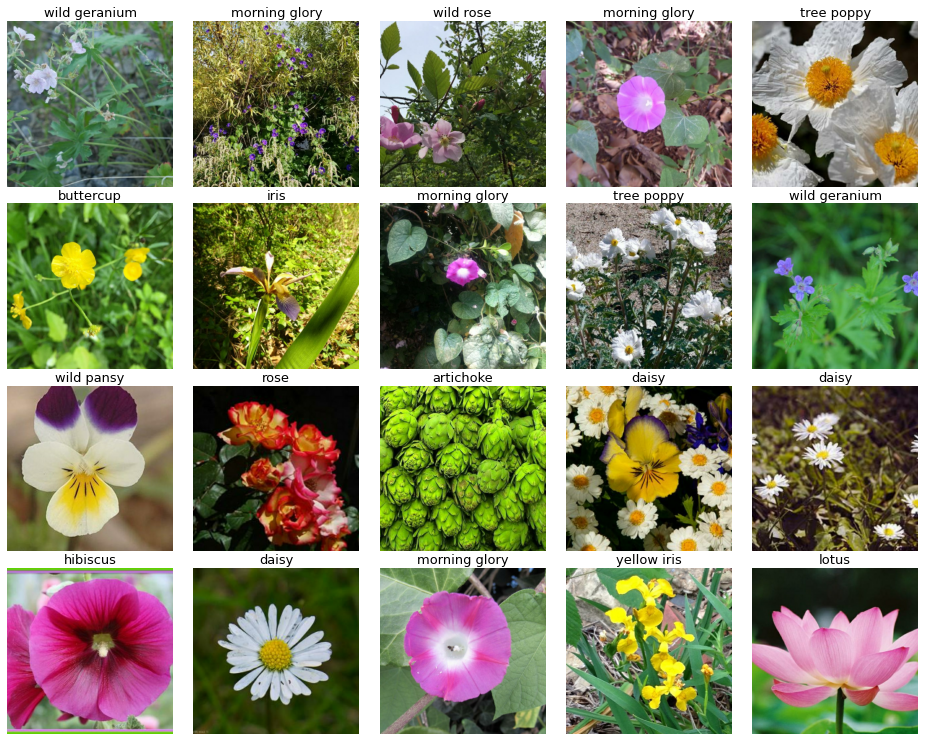

In [55]:
one_batch = next(ds_iter)
display_batch_of_images(one_batch)

**Data Augmentation version 1**

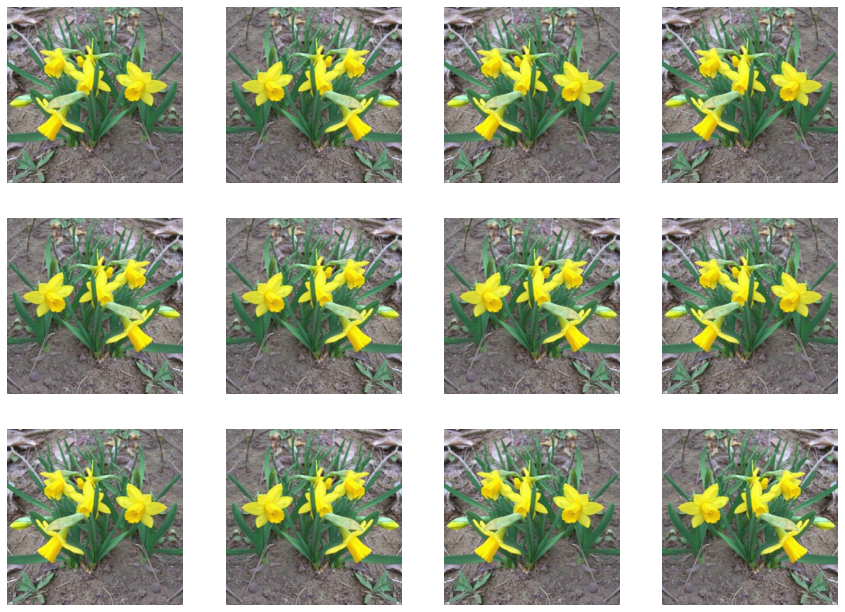

In [56]:
row = 3
col = 4
all_elements = get_training_dataset().unbatch()
one_element = tf.data.Dataset.from_tensors(next(iter(all_elements)))
# Map the images to the data augmentation function for image processing
augmented_element = one_element.repeat().map(data_augment).batch(row * col)

for (img, label) in augmented_element:
    plt.figure(figsize = (15, int(15 * row / col)))
    for j in range(row * col):
        plt.subplot(row, col, j + 1)
        plt.axis('off')
        plt.imshow(img[j, ])
    plt.show()
    break

**Data Augmentation version 2**

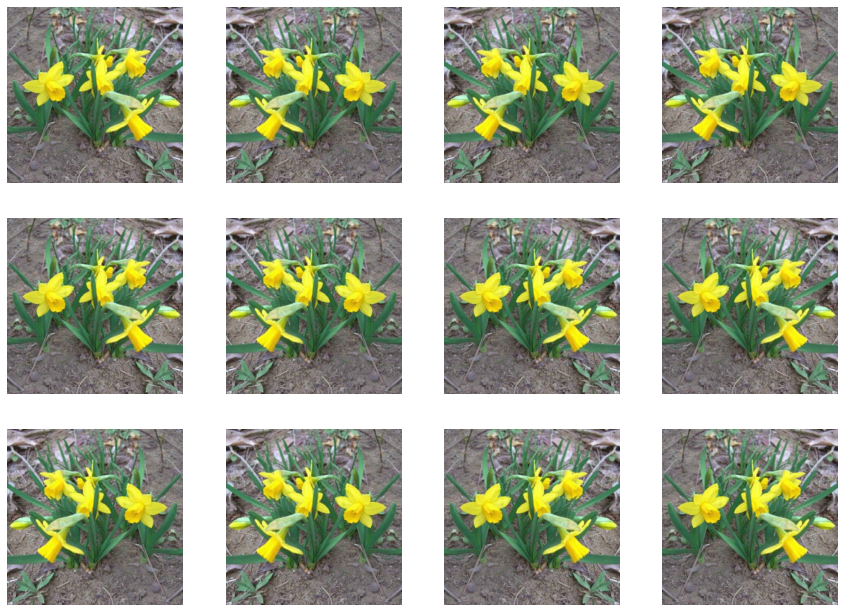

In [57]:
# Map the images to the data augmentation function for image processing
augmented_element = one_element.repeat().map(data_augment_v2).batch(row * col)

for (img, label) in augmented_element:
    plt.figure(figsize = (15, int(15 * row / col)))
    for j in range(row * col):
        plt.subplot(row, col, j + 1)
        plt.axis('off')
        plt.imshow(img[j, ])
    plt.show()
    break

In [58]:
import tensorflow_addons as tfa

# Randomly make some changes to the images and return the new images and labels
def data_augment_v3(image, label):
        
    # Set seed for data augmentation
    seed = 100
    
    # Randomly resize and then crop images
    image = tf.image.resize(image, [720, 720])
    image = tf.image.random_crop(image, [512, 512, 3], seed = seed)

    # Randomly reset brightness of images
    image = tf.image.random_brightness(image, 0.6, seed = seed)
    
    # Randomly reset saturation of images
    image = tf.image.random_saturation(image, 3, 5, seed = seed)
        
    # Randomly reset contrast of images
    image = tf.image.random_contrast(image, 0.3, 0.5, seed = seed)

    # Randomly reset hue of images, but this will make the colors really weird, which we think will not happen
    # in common photography
    # image = tf.image.random_hue(image, 0.5, seed = seed)
    
    # Blur images
    image = tfa.image.mean_filter2d(image, filter_shape = 10)
    
    # Randomly flip images
    image = tf.image.random_flip_left_right(image, seed = seed)
    image = tf.image.random_flip_up_down(image, seed = seed)
    
    # Fail to rotate and transform images due to some bug in TensorFlow
    # angle = random.randint(0, 180)
    # image = tfa.image.rotate(image, tf.constant(np.pi * angle / 180))
    # image = tfa.image.transform(image, [1.0, 1.0, -250, 0.0, 1.0, 0.0, 0.0, 0.0])
    
    return image, label

**Data Augmentation version 3**

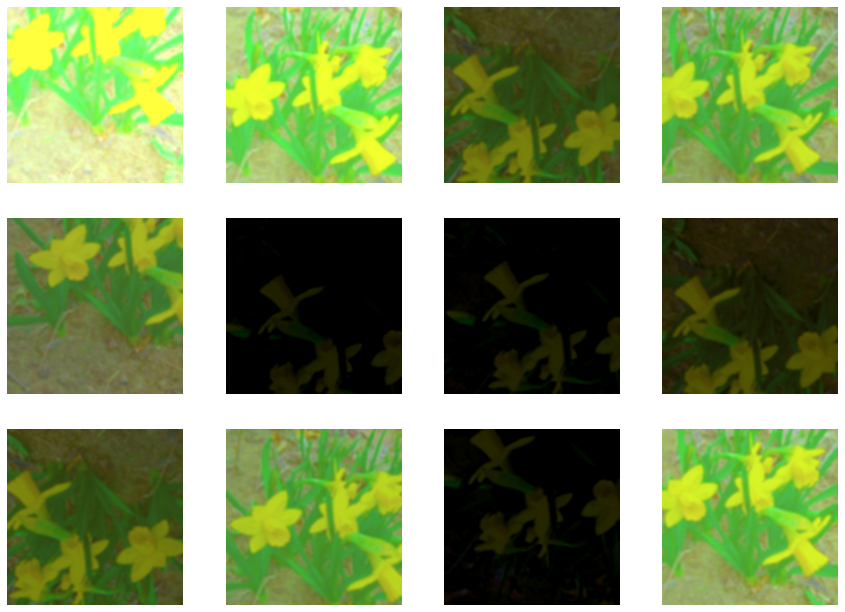

In [59]:
# Map the images to the data augmentation function for image processing
augmented_element = one_element.repeat().map(data_augment_v3).batch(row * col)

for (img, label) in augmented_element:
    plt.figure(figsize = (15, int(15 * row / col)))
    for j in range(row * col):
        plt.subplot(row, col, j + 1)
        plt.axis('off')
        plt.imshow(img[j, ])
    plt.show()
    break

In [60]:
', '.join(tf.keras.applications.__dir__())

'__name__, __doc__, __package__, __loader__, __spec__, __path__, __file__, __cached__, __builtins__, _sys, densenet, efficientnet, imagenet_utils, inception_resnet_v2, inception_v3, mobilenet, mobilenet_v2, mobilenet_v3, nasnet, resnet, resnet50, resnet_v2, vgg16, vgg19, xception, DenseNet121, DenseNet169, DenseNet201, EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7, InceptionResNetV2, InceptionV3, MobileNet, MobileNetV2, MobileNetV3Large, MobileNetV3Small, NASNetLarge, NASNetMobile, ResNet101, ResNet152, ResNet50, ResNet101V2, ResNet152V2, ResNet50V2, VGG16, VGG19, Xception'

In [61]:
# Model weights are saved at the end of every epoch, if it's the best seen so far during model.fit
checkpoint_filepath = "Petals_to_the_Metal-70K_images-trainable_True-MobileNetV2.h5" #"Petals_to_the_Metal-70K_images-trainable_True-DenseNet201.h5"

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True
)

In [62]:
# This callback will stop the training when there is no improvement in the validation loss for three consecutive epochs. 
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [63]:
use_efficientnet = False #tuning9
if use_efficientnet:
    !pip install -q efficientnet
    from efficientnet.tfkeras import EfficientNetB7

In [64]:
weight_per_class = True

if weight_per_class:
    from collections import Counter
    import gc

    gc.enable()

    def get_training_dataset_raw():
        dataset = load_dataset(TRAINING_FILENAMES, labeled = True, ordered = False)
        return dataset

    raw_training_dataset = get_training_dataset_raw()

    label_counter = Counter()
    for images, labels in raw_training_dataset:
        label_counter.update([labels.numpy()])

    del raw_training_dataset    

    TARGET_NUM_PER_CLASS = 122 #?

    def get_weight_for_class(class_id):
        counting = label_counter[class_id]
        weight = TARGET_NUM_PER_CLASS / counting
        return weight

    weight_per_class = {class_id: get_weight_for_class(class_id) for class_id in range(104)}

2023-01-14 15:13:46.184350: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 123178, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673709226.184268712","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 123178, Output num: 1","grpc_status":3}


In [65]:
using_ensemble_models = False

In [66]:
using_ensemble_models

False

In [67]:
if not using_ensemble_models:
    # Define training epochs
    EPOCHS = 10

    # Define the batch size. This will be 16 with TPU off and 128 (=16*8) with TPU on
    BATCH_SIZE = 16 * strategy.num_replicas_in_sync #See Note 3.1 above 😀

    STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

## Learning Rate Schedule ##

Learning rate schedule: 1e-05 to 0.0004 to 0.000133


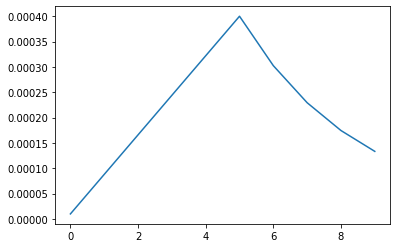

In [68]:
if not using_ensemble_models:
    # Learning Rate Schedule for Fine Tuning #
    def exponential_lr(epoch,
                       start_lr = 0.00001, min_lr = 0.00001, max_lr = 0.00005 * strategy.num_replicas_in_sync, #tuning1
                       rampup_epochs = 5, sustain_epochs = 0,
                       exp_decay = 0.75): #tuning1

        def lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay):
            # linear increase from start to rampup_epochs
            if epoch < rampup_epochs:
                lr = ((max_lr - start_lr) /
                      rampup_epochs * epoch + start_lr)
            # constant max_lr during sustain_epochs
            elif epoch < rampup_epochs + sustain_epochs:
                lr = max_lr
            # exponential decay towards min_lr
            else:
                lr = ((max_lr - min_lr) *
                      exp_decay**(epoch - rampup_epochs - sustain_epochs) +
                      min_lr)
            return lr
        return lr(epoch,
                  start_lr,
                  min_lr,
                  max_lr,
                  rampup_epochs,
                  sustain_epochs,
                  exp_decay)

    lr_callback = tf.keras.callbacks.LearningRateScheduler(exponential_lr, verbose=True)

    rng = [i for i in range(EPOCHS)]
    y = [exponential_lr(x) for x in rng]
    plt.plot(rng, y)
    print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [69]:
def create_model(name="DenseNet201", trainable=False):
    tf.keras.backend.clear_session()
    
    with strategy.scope():
        if name == "vgg16":
            pretrained_model = tf.keras.applications.VGG16(
                weights='imagenet',
                include_top=False,
                input_shape=[*IMAGE_SIZE, 3]
            )
            pretrained_model.trainable = trainable
        elif name == "MobileNetV3Small":
            pretrained_model = tf.keras.applications.MobileNetV3Small(
                input_shape=[*IMAGE_SIZE, 3],
                include_top=False,
                weights='imagenet',
                dropout_rate=0.2,
            )
            pretrained_model.trainable = trainable
        elif name == "resnet50":
            pretrained_model = tf.keras.applications.resnet50.ResNet50(
                input_shape=[*IMAGE_SIZE, 3],
                include_top=False,
                weights='imagenet',
            )
            pretrained_model.trainable = trainable
        elif name == "Xception":
            pretrained_model = tf.keras.applications.xception.Xception(
                input_shape=[*IMAGE_SIZE, 3],
                include_top=False,
                weights='imagenet',
            )
            pretrained_model.trainable = trainable
        elif name == "MobileNetV2":
            pretrained_model = tf.keras.applications.MobileNetV2(
                include_top=False ,
                weights='imagenet', 
                input_shape=[*IMAGE_SIZE, 3]
            )
            pretrained_model.trainable = True
        elif name == "EfficientNetB3":
            pretrained_model = tf.keras.applications.efficientnet.EfficientNetB3(
                include_top=False, 
                weights="imagenet",
                input_shape=(*IMAGE_SIZE, 3), 
                pooling='max'
            )
            pretrained_model.trainable = True
        elif name == "EfficientNetB7":
            pretrained_model =  tf.keras.applications.efficientnet.EfficientNetB7(
                weights = 'imagenet', 
                include_top = False, 
                input_shape = [*IMAGE_SIZE, 3]
            )
            pretrained_model.trainable = True
        elif name == "DenseNet201":
            pretrained_model = tf.keras.applications.DenseNet201(
            include_top=False ,
            weights='imagenet', 
            input_shape=[*IMAGE_SIZE, 3]
            )
            pretrained_model.trainable = True #tuning8 pretrained_model.trainable = True
        elif name == "custom_cnn_3":
            model = keras.Sequential([
            # CNN_1
            keras.layers.Conv2D(8, 7, padding="same", input_shape=[*IMAGE_SIZE, 3]),
            keras.layers.MaxPool2D((2, 2)),

            # CNN_2
            keras.layers.Conv2D(16, 5, padding="same", input_shape=[*IMAGE_SIZE, 3]),
            keras.layers.MaxPool2D((2, 2)),

            # CNN_3
            keras.layers.Conv2D(32, 3, padding="same", input_shape=[*IMAGE_SIZE, 3]),
            keras.layers.MaxPool2D((2, 2)),

            # Output
            keras.layers.Flatten(),
            keras.layers.Dense(64, activation="relu"),
            keras.layers.Dense(64, activation="relu"),
            keras.layers.Dense(len(CLASSES), activation="softmax")
          ])

            return model
        elif name == "custom_vgg_3":
            model = tf.keras.Sequential()

            # VGG_1
            model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
            model.add(tf.keras.layers.Dropout(0.2))

            # VGG_2
            model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
            model.add(tf.keras.layers.Dropout(0.3))

            # VGG_3
            model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=[*IMAGE_SIZE, 3]))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
            model.add(tf.keras.layers.Dropout(0.4))

            # Output
            model.add(tf.keras.layers.Flatten())
            model.add(tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_uniform'))
            model.add(tf.keras.layers.BatchNormalization())
            model.add(tf.keras.layers.Dropout(0.5))
            model.add(tf.keras.layers.Dense(len(CLASSES), activation='softmax'))
            return model
        else:
            print("{name} is wrong!")

        model = tf.keras.Sequential([
        pretrained_model, #Base pretrained on ImageNet to extract features from images

        tf.keras.layers.GlobalAveragePooling2D(), ##Attach a new head to act as a classifier
        #tf.keras.layers.Dropout(0.3), #tuning3
        tf.keras.layers.Dense(len(CLASSES), activation='softmax')
        ])
    return model

# DenseNet201 Model

In [70]:
model_DenseNet201 = create_model('DenseNet201', trainable=True)

model_DenseNet201.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy', 'accuracy'],
)

model_DenseNet201.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 16, 16, 1920)      18321984  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1920)              0         
_________________________________________________________________
dense (Dense)                (None, 104)               199784    
Total params: 18,521,768
Trainable params: 18,292,712
Non-trainable params: 229,056
_________________________________________________________________


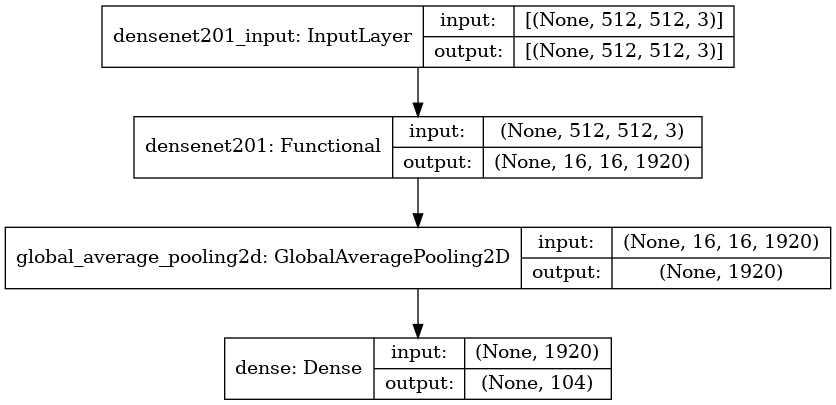

In [71]:
tf.keras.utils.plot_model(model_DenseNet201, show_shapes=True)

In [72]:
if not using_ensemble_models:
    history_DenseNet201 = model_DenseNet201.fit(
        ds_train,
        validation_data=ds_valid,
        epochs=EPOCHS,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[lr_callback, checkpoint], # Model weights are saved at the end of every epoch, if it's the best seen so far
        #workers = 3 #tuning5 https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras
        class_weight = weight_per_class #tuning11
    )

Epoch 1/10

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.
99/99 [==============================] - 238s 774ms/step - loss: 3.1080 - sparse_categorical_accuracy: 0.2966 - accuracy: 0.2966 - val_loss: 9.6941 - val_sparse_categorical_accuracy: 0.1107 - val_accuracy: 0.1107


2023-01-14 15:20:01.300144: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 216519, Output num: 2
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673709601.300083684","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 216519, Output num: 2","grpc_status":3}


Epoch 2/10

Epoch 00002: LearningRateScheduler reducing learning rate to 0.000880000037997961.
99/99 [==============================] - 55s 553ms/step - loss: 0.9289 - sparse_categorical_accuracy: 0.7235 - accuracy: 0.7235 - val_loss: 2.3790 - val_sparse_categorical_accuracy: 0.5272 - val_accuracy: 0.5272
Epoch 3/10

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000688000039048493.
99/99 [==============================] - 54s 547ms/step - loss: 0.4857 - sparse_categorical_accuracy: 0.8394 - accuracy: 0.8394 - val_loss: 0.7193 - val_sparse_categorical_accuracy: 0.8214 - val_accuracy: 0.8214
Epoch 4/10

Epoch 00004: LearningRateScheduler reducing learning rate to 0.0005152000233158469.
99/99 [==============================] - 55s 551ms/step - loss: 0.2500 - sparse_categorical_accuracy: 0.9021 - accuracy: 0.9021 - val_loss: 0.5231 - val_sparse_categorical_accuracy: 0.8745 - val_accuracy: 0.8745
Epoch 5/10

Epoch 00005: LearningRateScheduler reducing learning rate to 0.000

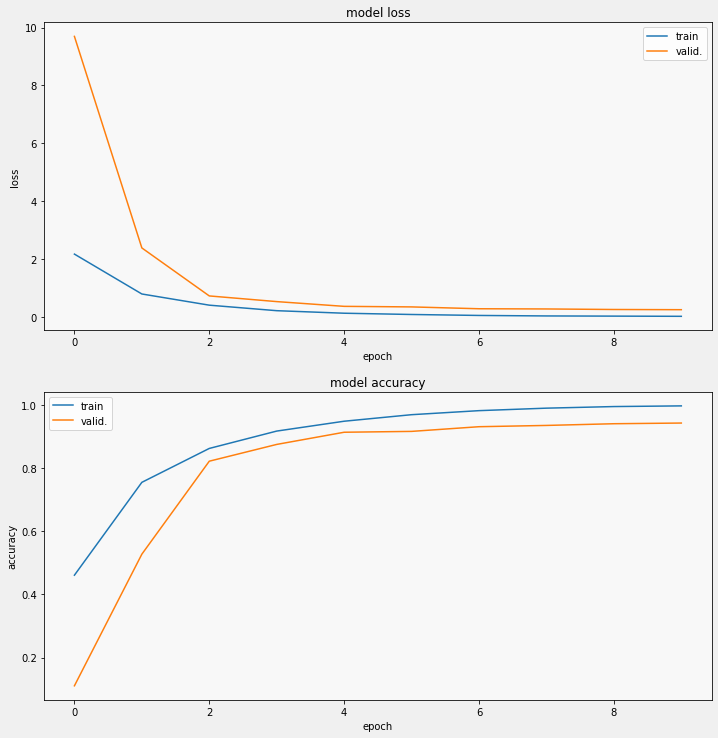

In [73]:
if not using_ensemble_models:
    display_training_curves(
        history_DenseNet201.history['loss'],
        history_DenseNet201.history['val_loss'],
        'loss',
        211,
    )
    display_training_curves(
        history_DenseNet201.history['sparse_categorical_accuracy'],
        history_DenseNet201.history['val_sparse_categorical_accuracy'],
        'accuracy',
        212,
    )

In [76]:

import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model_DenseNet201 '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [78]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model_DenseNet201.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2023-01-14 15:36:40.359562: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 302972, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673710600.359460921","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 302972, Output num: 0","grpc_status":3}


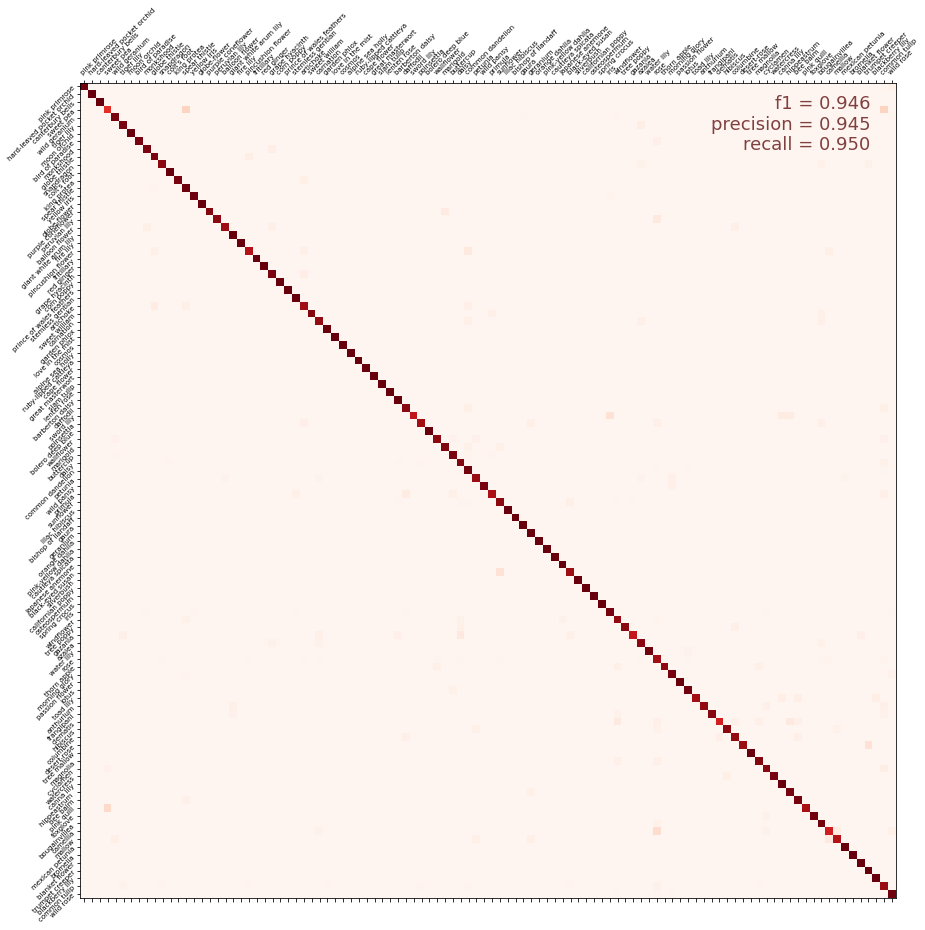

In [79]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
display_confusion_matrix(cmat, score, precision, recall)

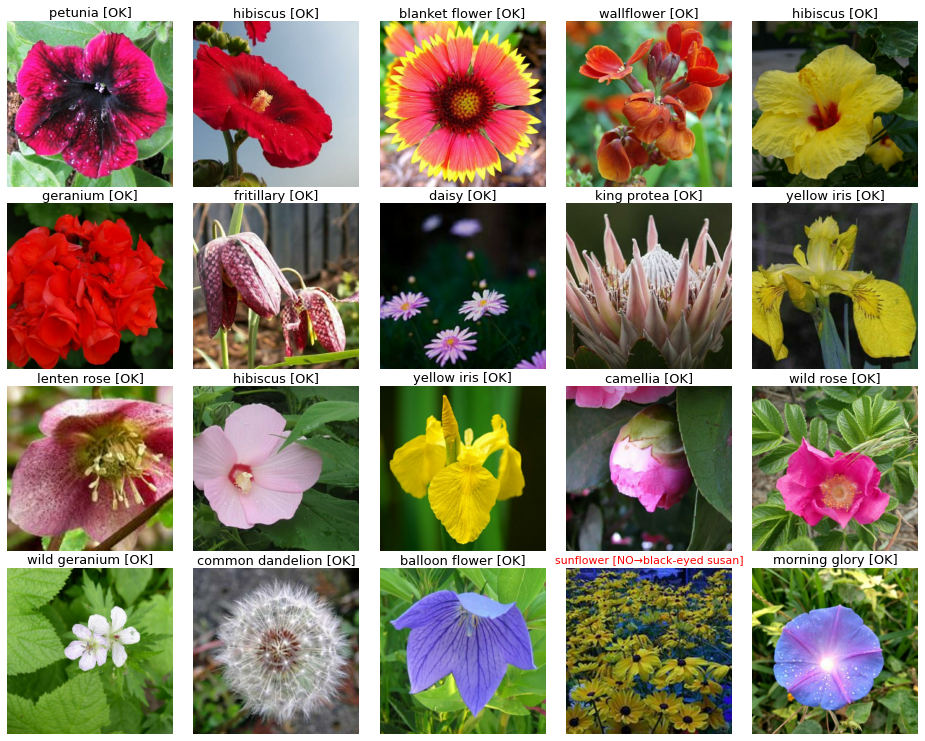

Computing predictions...
[ 67  28  83 ...  74 102  62]
Generating submission.csv file...
id,label
252d840db,67
1c4736dea,28
c37a6f3e9,83
00e4f514e,103
59d1b6146,46
8d808a07b,53
aeb67eefb,52
53cfc6586,29
aaa580243,82


In [80]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

images, labels = next(batch)
probabilities = model_DenseNet201.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model_DenseNet201.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'submission.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# Look at the first few predictions
!head submission.csv

## Xception Model

In [81]:
model_Xception = create_model('Xception', trainable=True)

model_Xception.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy', 'accuracy'],
)

model_Xception.summary()

83689472/83683744 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 16, 16, 2048)      20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 104)               213096    
Total params: 21,074,576
Trainable params: 21,020,048
Non-trainable params: 54,528
_________________________________________________________________


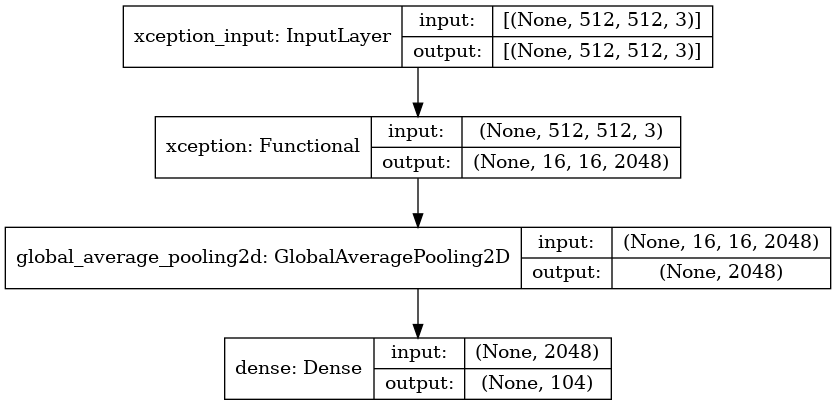

In [82]:
tf.keras.utils.plot_model(model_Xception, show_shapes=True)

In [83]:
if not using_ensemble_models:
    history_Xception = model_Xception.fit(
        ds_train,
        validation_data=ds_valid,
        epochs=EPOCHS,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[lr_callback, checkpoint], # Model weights are saved at the end of every epoch, if it's the best seen so far
        #workers = 3 #tuning5 https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras
        class_weight = weight_per_class #tuning11
    )

Epoch 1/10

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.


2023-01-14 15:38:04.219088: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 94805, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673710684.218982412","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 94805, Output num: 1","grpc_status":3}


99/99 [==============================] - 88s 423ms/step - loss: 3.0257 - sparse_categorical_accuracy: 0.3419 - accuracy: 0.3419 - val_loss: 2.2829 - val_sparse_categorical_accuracy: 0.4512 - val_accuracy: 0.4512


2023-01-14 15:39:20.384316: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 325328, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673710760.384258388","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 325328, Output num: 0","grpc_status":3}


Epoch 2/10

Epoch 00002: LearningRateScheduler reducing learning rate to 0.000880000037997961.
99/99 [==============================] - 36s 359ms/step - loss: 0.5891 - sparse_categorical_accuracy: 0.8163 - accuracy: 0.8163 - val_loss: 0.8095 - val_sparse_categorical_accuracy: 0.7883 - val_accuracy: 0.7883
Epoch 3/10

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000688000039048493.
99/99 [==============================] - 35s 352ms/step - loss: 0.3029 - sparse_categorical_accuracy: 0.8913 - accuracy: 0.8913 - val_loss: 0.4221 - val_sparse_categorical_accuracy: 0.8949 - val_accuracy: 0.8949
Epoch 4/10

Epoch 00004: LearningRateScheduler reducing learning rate to 0.0005152000233158469.
99/99 [==============================] - 35s 352ms/step - loss: 0.1098 - sparse_categorical_accuracy: 0.9462 - accuracy: 0.9462 - val_loss: 0.3293 - val_sparse_categorical_accuracy: 0.9184 - val_accuracy: 0.9184
Epoch 5/10

Epoch 00005: LearningRateScheduler reducing learning rate to 0.000

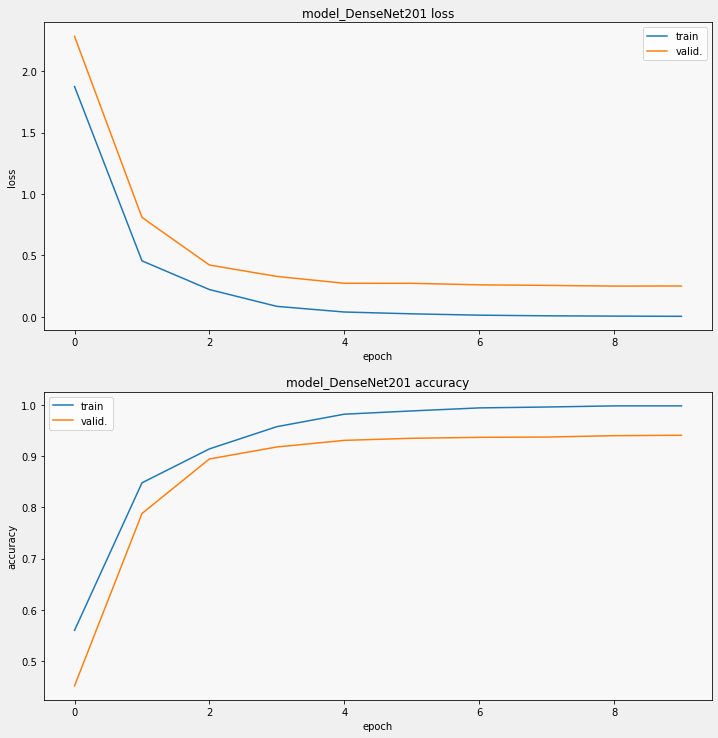

In [84]:
if not using_ensemble_models:
    display_training_curves(
        history_Xception.history['loss'],
        history_Xception.history['val_loss'],
        'loss',
        211,
    )
    display_training_curves(
        history_Xception.history['sparse_categorical_accuracy'],
        history_Xception.history['val_sparse_categorical_accuracy'],
        'accuracy',
        212,
    )

In [85]:

import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model_Xception '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [86]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model_Xception.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2023-01-14 15:44:51.350384: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 339323, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673711091.350148298","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 339323, Output num: 0","grpc_status":3}


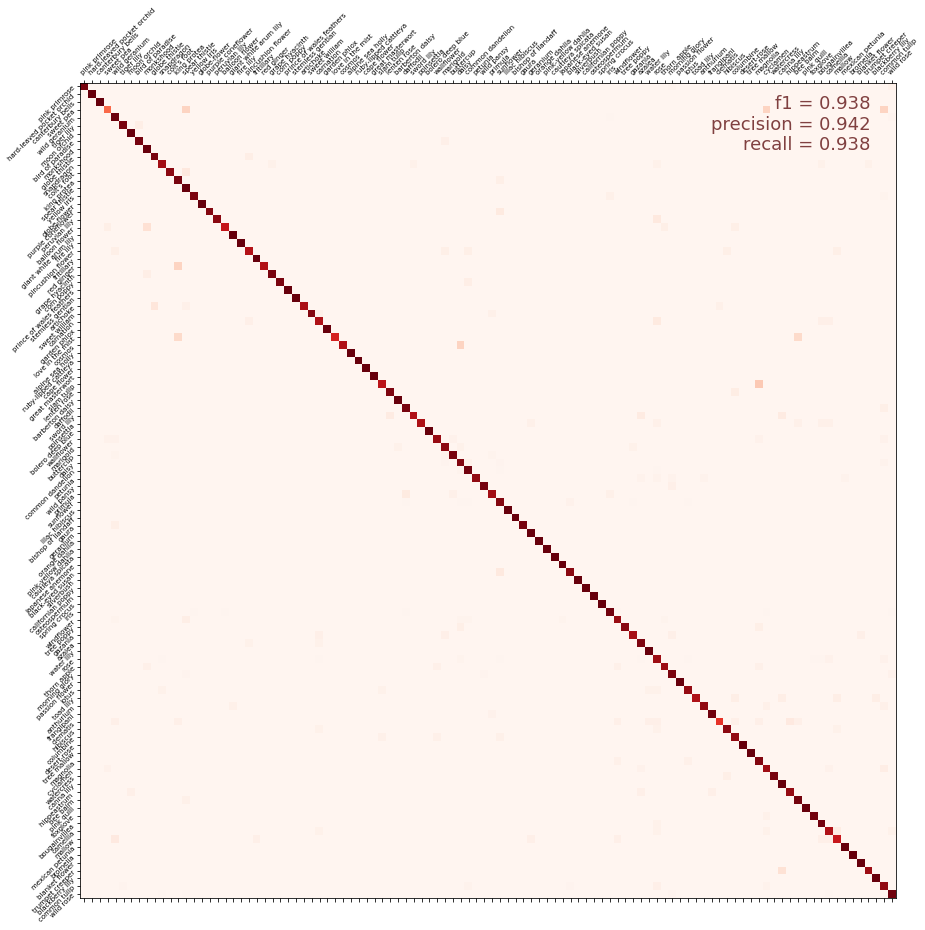

In [87]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
display_confusion_matrix(cmat, score, precision, recall)

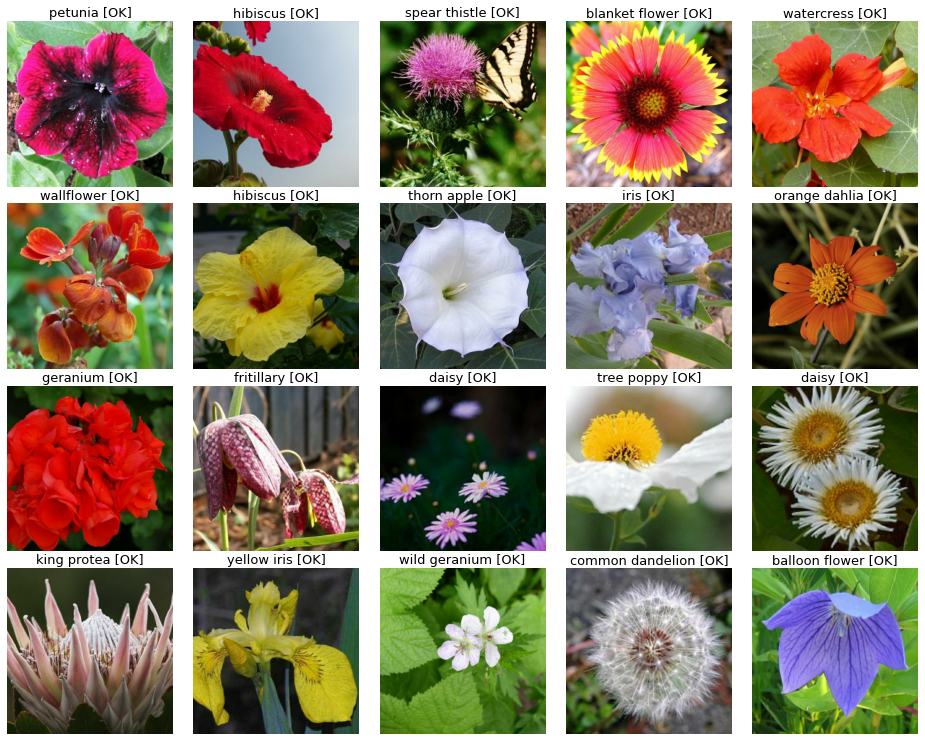

Computing predictions...
[ 67  28  83 ...  86 102  62]
Generating submission.csv file...
id,label
252d840db,67
1c4736dea,28
c37a6f3e9,83
00e4f514e,103
59d1b6146,46
8d808a07b,53
aeb67eefb,52
53cfc6586,29
aaa580243,82


In [88]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

images, labels = next(batch)
probabilities = model_Xception.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model_Xception.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'submission_Xception.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# Look at the first few predictions
!head submission.csv

## resnet50 Model

In [96]:
model_resnet50 = create_model('resnet50', trainable=True)

model_resnet50.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy', 'accuracy'],
)

model_resnet50.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 16, 16, 2048)      23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 104)               213096    
Total params: 23,800,808
Trainable params: 23,747,688
Non-trainable params: 53,120
_________________________________________________________________


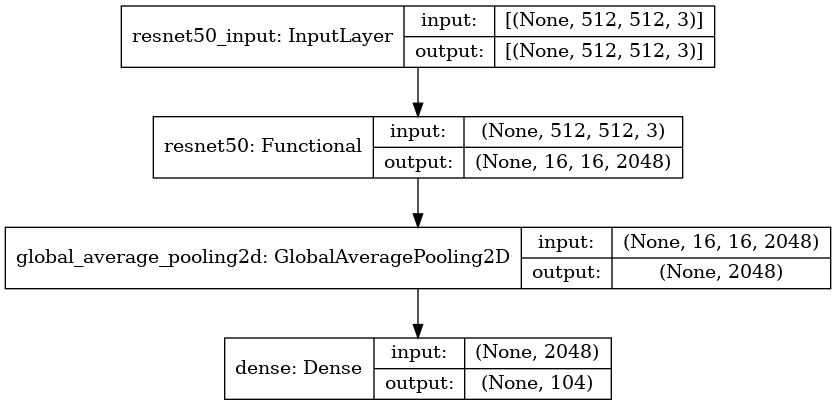

In [97]:
tf.keras.utils.plot_model(model_resnet50, show_shapes=True)

In [98]:
if not using_ensemble_models:
    history_resnet50 = model_resnet50.fit(
        ds_train,
        validation_data=ds_valid,
        epochs=EPOCHS,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[lr_callback, checkpoint], # Model weights are saved at the end of every epoch, if it's the best seen so far
        #workers = 3 #tuning5 https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras
        class_weight = weight_per_class #tuning11
    )

Epoch 1/10

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.
99/99 [==============================] - 98s 427ms/step - loss: 3.7500 - sparse_categorical_accuracy: 0.1682 - accuracy: 0.1682 - val_loss: 4.9618 - val_sparse_categorical_accuracy: 0.0046 - val_accuracy: 0.0046


2023-01-14 16:03:16.869568: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 416601, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673712196.869229055","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 416601, Output num: 1","grpc_status":3}


Epoch 2/10

Epoch 00002: LearningRateScheduler reducing learning rate to 0.000880000037997961.
99/99 [==============================] - 33s 337ms/step - loss: 1.4867 - sparse_categorical_accuracy: 0.5552 - accuracy: 0.5552 - val_loss: 19.1160 - val_sparse_categorical_accuracy: 0.0022 - val_accuracy: 0.0022
Epoch 3/10

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000688000039048493.
99/99 [==============================] - 34s 340ms/step - loss: 0.8586 - sparse_categorical_accuracy: 0.7010 - accuracy: 0.7010 - val_loss: 5.8097 - val_sparse_categorical_accuracy: 0.0453 - val_accuracy: 0.0453
Epoch 4/10

Epoch 00004: LearningRateScheduler reducing learning rate to 0.0005152000233158469.
99/99 [==============================] - 33s 336ms/step - loss: 0.4812 - sparse_categorical_accuracy: 0.8156 - accuracy: 0.8156 - val_loss: 6.3436 - val_sparse_categorical_accuracy: 0.0501 - val_accuracy: 0.0501
Epoch 5/10

Epoch 00005: LearningRateScheduler reducing learning rate to 0.00

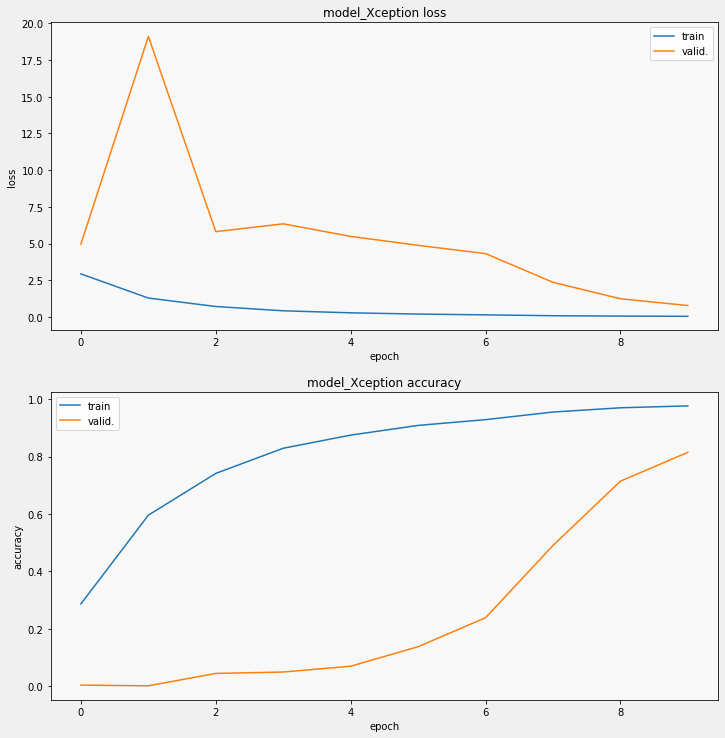

In [99]:
if not using_ensemble_models:
    display_training_curves(
        history_resnet50.history['loss'],
        history_resnet50.history['val_loss'],
        'loss',
        211,
    )
    display_training_curves(
        history_resnet50.history['sparse_categorical_accuracy'],
        history_resnet50.history['val_sparse_categorical_accuracy'],
        'accuracy',
        212,
    )

In [100]:

import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model_resnet50 '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [101]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model_resnet50.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2023-01-14 16:08:32.269763: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 430596, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673712512.269670611","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 430596, Output num: 0","grpc_status":3}


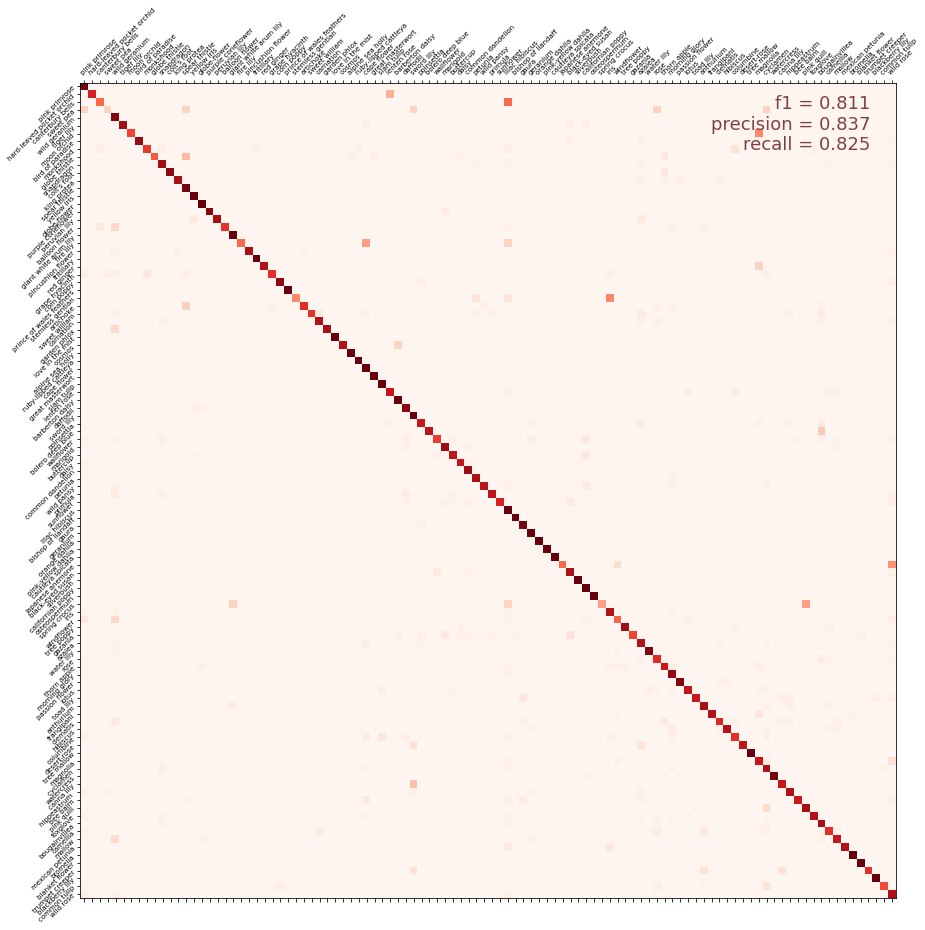

In [102]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
display_confusion_matrix(cmat, score, precision, recall)

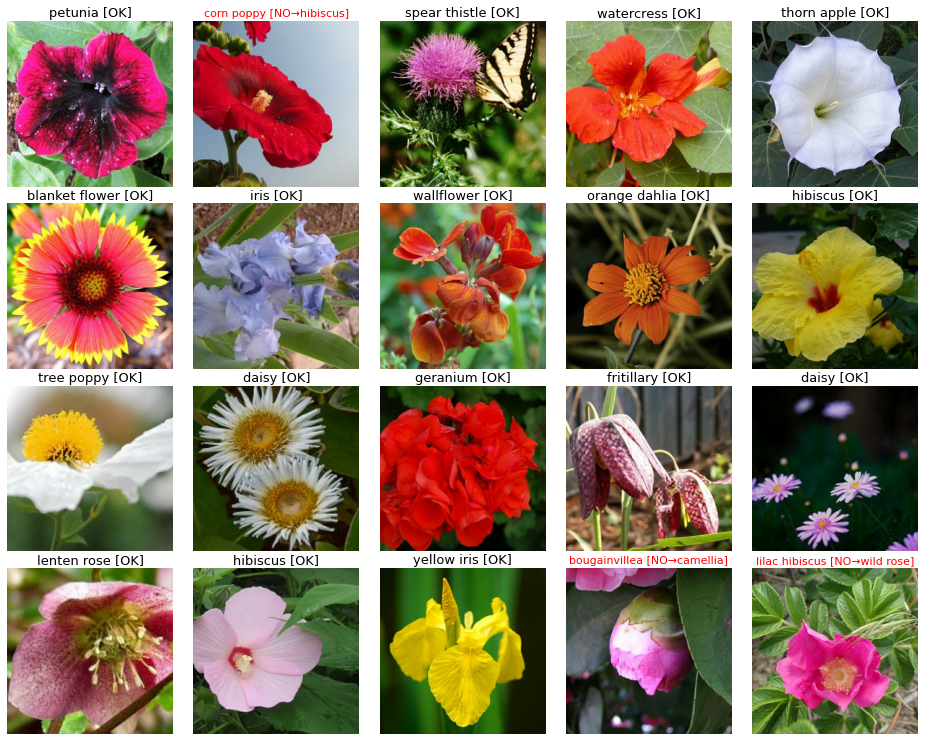

Computing predictions...
[67 28 77 ... 86 14 62]
Generating submission.csv file...
id,label
252d840db,67
1c4736dea,28
c37a6f3e9,83
00e4f514e,103
59d1b6146,46
8d808a07b,53
aeb67eefb,52
53cfc6586,29
aaa580243,82


In [103]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

images, labels = next(batch)
probabilities = model_resnet50.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model_resnet50.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'submission_resnet50.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# Look at the first few predictions
!head submission.csv

## CNN_3_Layers Model

In [104]:
model_custom_cnn_3 = create_model('custom_cnn_3', trainable=True)

model_custom_cnn_3.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy', 'accuracy'],
)

model_custom_cnn_3.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 512, 512, 8)       1184      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 256, 256, 8)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 16)      3216      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 131072)            0

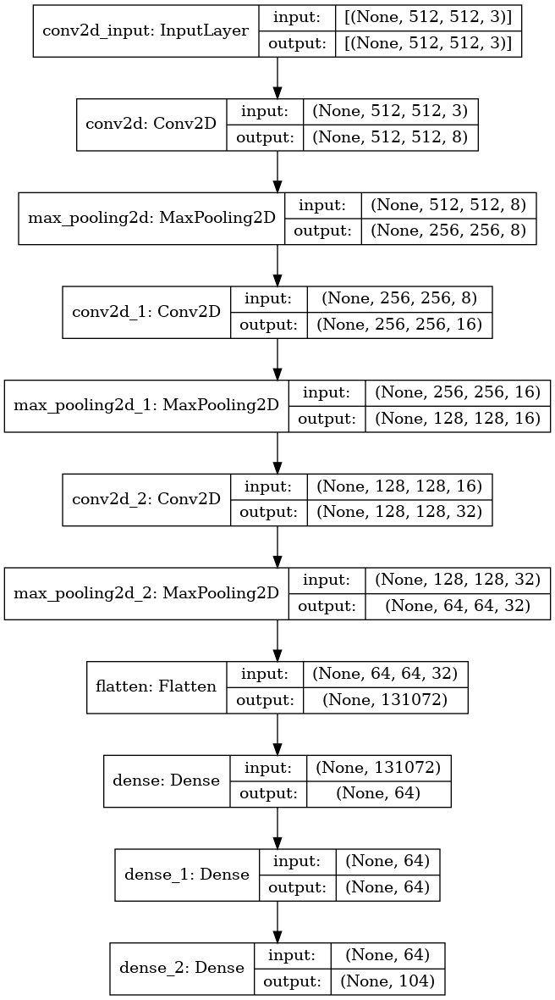

In [106]:
tf.keras.utils.plot_model(model_custom_cnn_3, show_shapes=True)

In [107]:
if not using_ensemble_models:
    history_custom_cnn_3 = model_custom_cnn_3.fit(
        ds_train,
        validation_data=ds_valid,
        epochs=EPOCHS,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[lr_callback, checkpoint], # Model weights are saved at the end of every epoch, if it's the best seen so far
        #workers = 3 #tuning5 https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras
        class_weight = weight_per_class #tuning11
    )

Epoch 1/10

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.
99/99 [==============================] - 48s 307ms/step - loss: 5.5154 - sparse_categorical_accuracy: 0.0202 - accuracy: 0.0202 - val_loss: 4.6423 - val_sparse_categorical_accuracy: 0.0086 - val_accuracy: 0.0086


2023-01-14 16:10:59.810496: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 433688, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673712659.810150597","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 433688, Output num: 1","grpc_status":3}


Epoch 2/10

Epoch 00002: LearningRateScheduler reducing learning rate to 0.000880000037997961.
99/99 [==============================] - 23s 235ms/step - loss: 4.6641 - sparse_categorical_accuracy: 0.0098 - accuracy: 0.0098 - val_loss: 4.6426 - val_sparse_categorical_accuracy: 0.0442 - val_accuracy: 0.0442
Epoch 3/10

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000688000039048493.
99/99 [==============================] - 23s 236ms/step - loss: 4.6748 - sparse_categorical_accuracy: 0.0203 - accuracy: 0.0203 - val_loss: 4.6427 - val_sparse_categorical_accuracy: 0.0086 - val_accuracy: 0.0086
Epoch 4/10

Epoch 00004: LearningRateScheduler reducing learning rate to 0.0005152000233158469.
99/99 [==============================] - 24s 238ms/step - loss: 4.6143 - sparse_categorical_accuracy: 0.0085 - accuracy: 0.0085 - val_loss: 4.6431 - val_sparse_categorical_accuracy: 0.0086 - val_accuracy: 0.0086
Epoch 5/10

Epoch 00005: LearningRateScheduler reducing learning rate to 0.000

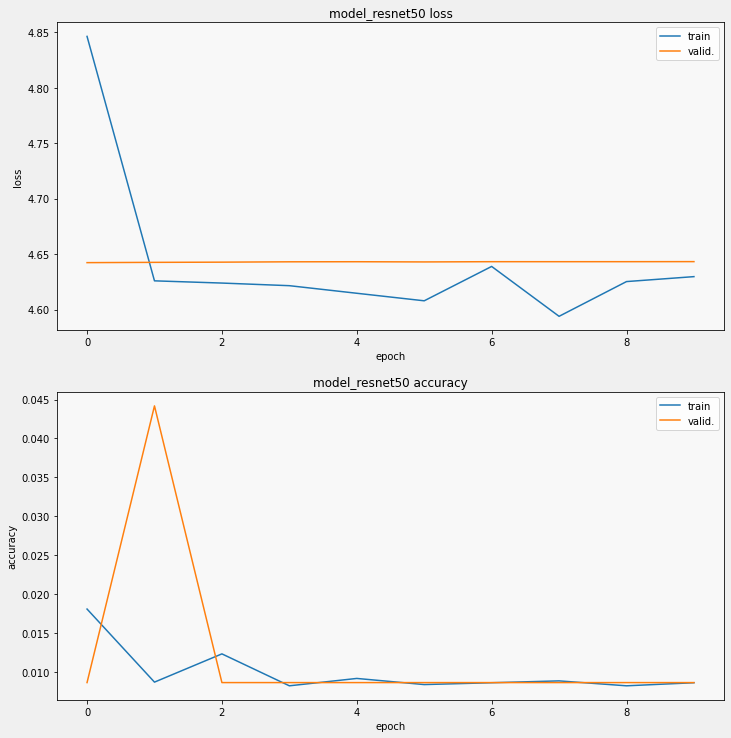

In [108]:
if not using_ensemble_models:
    display_training_curves(
        history_custom_cnn_3.history['loss'],
        history_custom_cnn_3.history['val_loss'],
        'loss',
        211,
    )
    display_training_curves(
        history_custom_cnn_3.history['sparse_categorical_accuracy'],
        history_custom_cnn_3.history['val_sparse_categorical_accuracy'],
        'accuracy',
        212,
    )

In [109]:

import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model_custom_cnn_3 '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [110]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model_custom_cnn_3.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2023-01-14 16:14:43.968828: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 447683, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673712883.968725318","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 447683, Output num: 0","grpc_status":3}


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


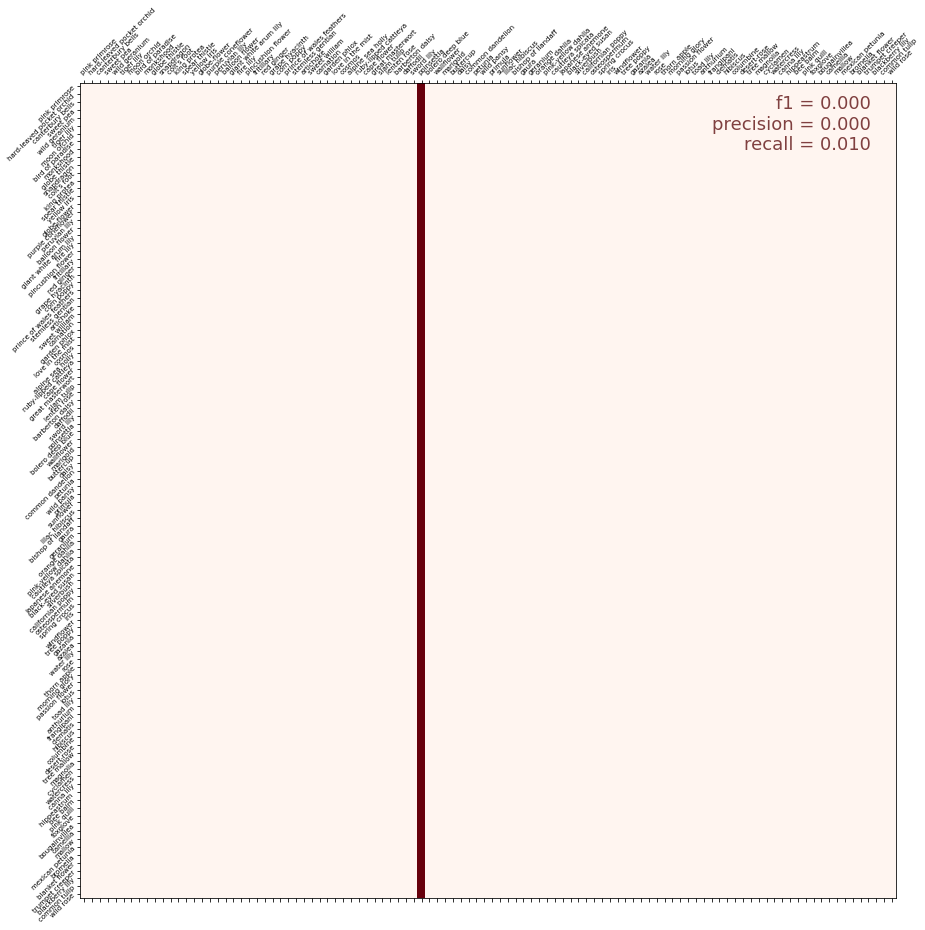

In [111]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
display_confusion_matrix(cmat, score, precision, recall)

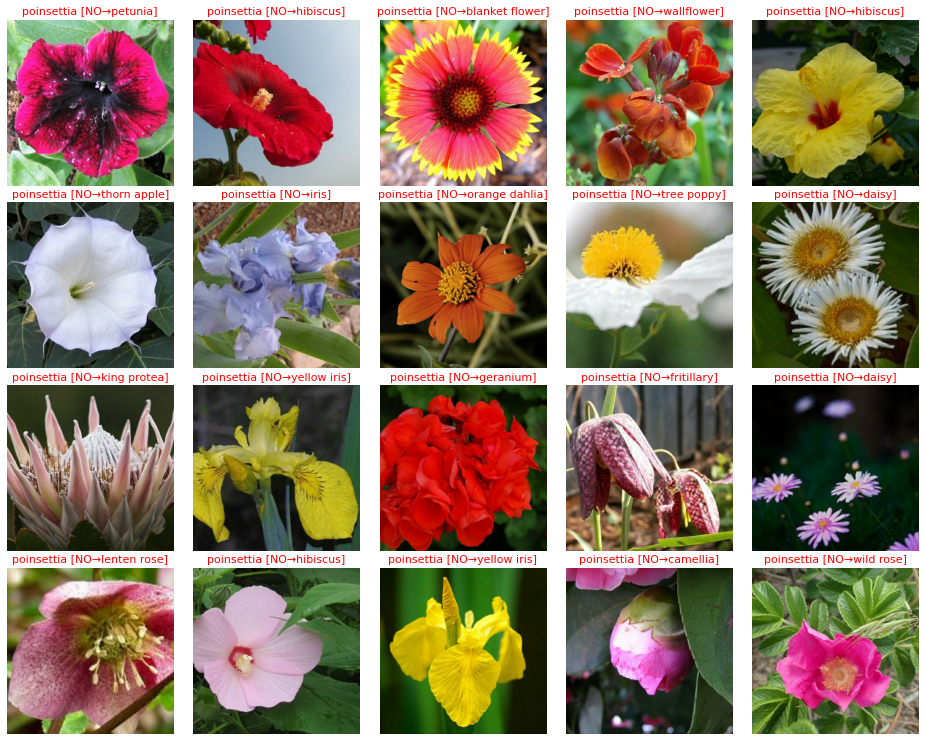

Computing predictions...
[43 43 43 ... 43 43 43]
Generating submission.csv file...
id,label
252d840db,43
1c4736dea,43
c37a6f3e9,43
00e4f514e,43
59d1b6146,43
8d808a07b,43
aeb67eefb,43
53cfc6586,43
aaa580243,43


In [112]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

images, labels = next(batch)
probabilities = model_custom_cnn_3.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model_custom_cnn_3.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'submission.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# Look at the first few predictions
!head submission.csv

## VGG_3_Layers Model

In [114]:
model_custom_vgg_3 = create_model('custom_vgg_3', trainable=True)

model_custom_vgg_3.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy', 'accuracy'],
)

model_custom_vgg_3.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 512, 512, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 512, 512, 32)      128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 512, 512, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 512, 512, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 256, 256, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 256, 256, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 256, 256, 64)      1

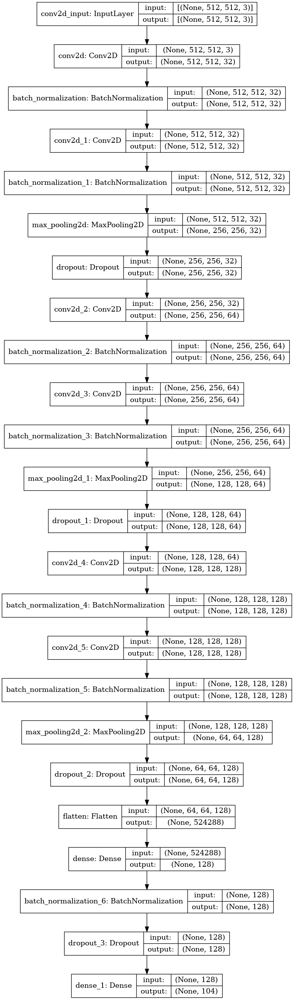

In [115]:
tf.keras.utils.plot_model(model_custom_vgg_3, show_shapes=True)

In [116]:
if not using_ensemble_models:
    history_custom_vgg_3 = model_custom_vgg_3.fit(
        ds_train,
        validation_data=ds_valid,
        epochs=EPOCHS,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[lr_callback, checkpoint], # Model weights are saved at the end of every epoch, if it's the best seen so far
        #workers = 3 #tuning5 https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras
        class_weight = weight_per_class #tuning11
    )

Epoch 1/10

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.
99/99 [==============================] - 63s 482ms/step - loss: 4.8701 - sparse_categorical_accuracy: 0.0189 - accuracy: 0.0189 - val_loss: 7.4218 - val_sparse_categorical_accuracy: 0.0129 - val_accuracy: 0.0129


2023-01-14 16:30:30.368431: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 452421, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673713830.368277567","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 452421, Output num: 1","grpc_status":3}


Epoch 2/10

Epoch 00002: LearningRateScheduler reducing learning rate to 0.000880000037997961.
99/99 [==============================] - 40s 407ms/step - loss: 4.0206 - sparse_categorical_accuracy: 0.0528 - accuracy: 0.0528 - val_loss: 5.5205 - val_sparse_categorical_accuracy: 0.0156 - val_accuracy: 0.0156
Epoch 3/10

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000688000039048493.
99/99 [==============================] - 39s 392ms/step - loss: 3.7569 - sparse_categorical_accuracy: 0.0880 - accuracy: 0.0880 - val_loss: 5.2939 - val_sparse_categorical_accuracy: 0.0191 - val_accuracy: 0.0191
Epoch 4/10

Epoch 00004: LearningRateScheduler reducing learning rate to 0.0005152000233158469.
99/99 [==============================] - 39s 395ms/step - loss: 3.6205 - sparse_categorical_accuracy: 0.0937 - accuracy: 0.0937 - val_loss: 4.5080 - val_sparse_categorical_accuracy: 0.0959 - val_accuracy: 0.0959
Epoch 5/10

Epoch 00005: LearningRateScheduler reducing learning rate to 0.000

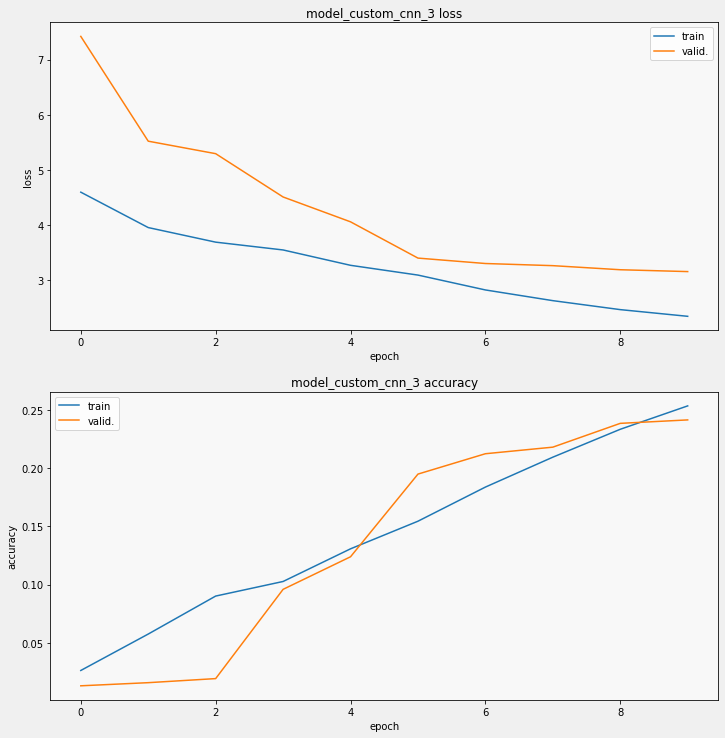

In [117]:
if not using_ensemble_models:
    display_training_curves(
        history_custom_vgg_3.history['loss'],
        history_custom_vgg_3.history['val_loss'],
        'loss',
        211,
    )
    display_training_curves(
        history_custom_vgg_3.history['sparse_categorical_accuracy'],
        history_custom_vgg_3.history['val_sparse_categorical_accuracy'],
        'accuracy',
        212,
    )

In [118]:

import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model_custom_vgg_3 '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [119]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model_custom_vgg_3.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2023-01-14 16:36:36.293944: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 466416, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1673714196.293796388","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 466416, Output num: 0","grpc_status":3}


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


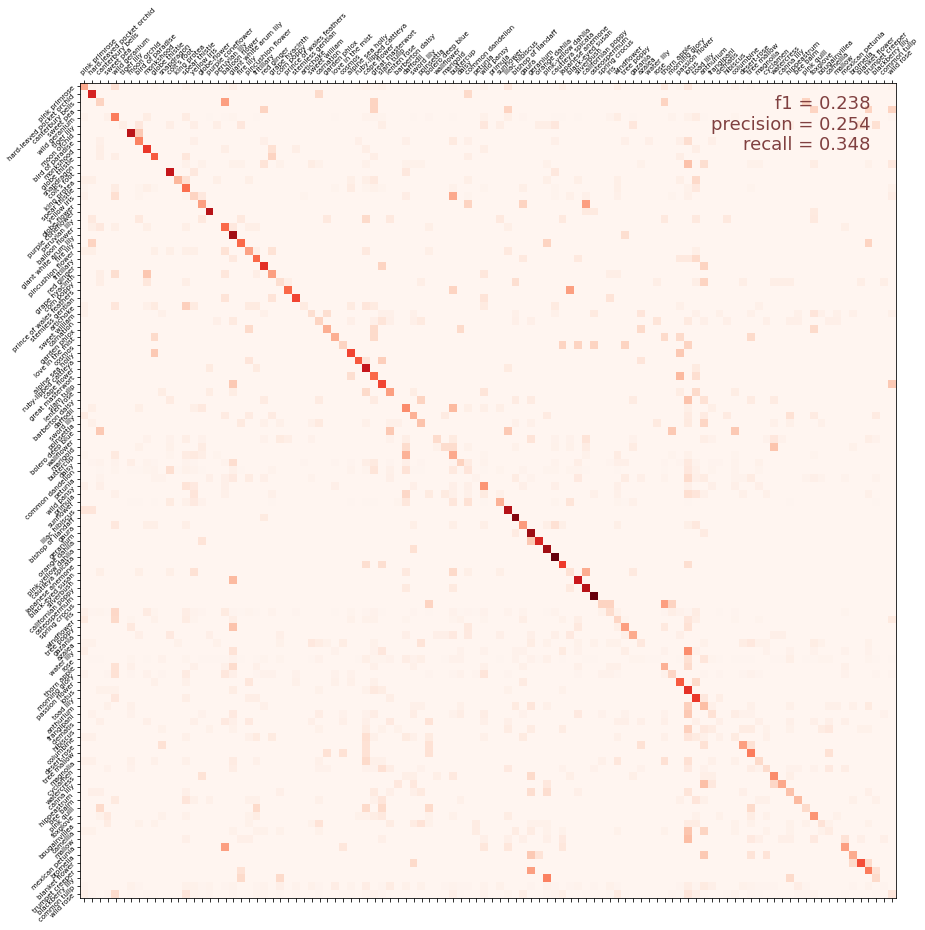

In [120]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
display_confusion_matrix(cmat, score, precision, recall)

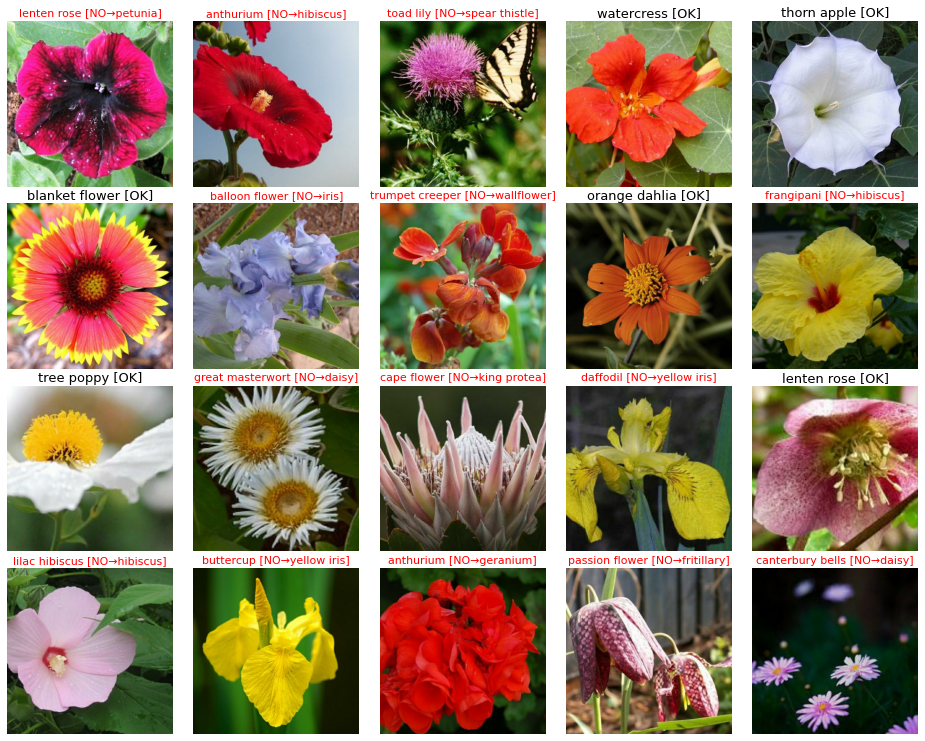

Computing predictions...
[ 4 78 18 ... 39 14 41]
Generating submission.csv file...
id,label
252d840db,4
1c4736dea,78
c37a6f3e9,18
00e4f514e,56
59d1b6146,49
8d808a07b,53
aeb67eefb,56
53cfc6586,63
aaa580243,87


In [121]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

images, labels = next(batch)
probabilities = model_custom_vgg_3.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model_custom_vgg_3.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'submission.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# Look at the first few predictions
!head submission.csv